# **Load**

In [4]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
import random
import string
import os
from tqdm import tqdm

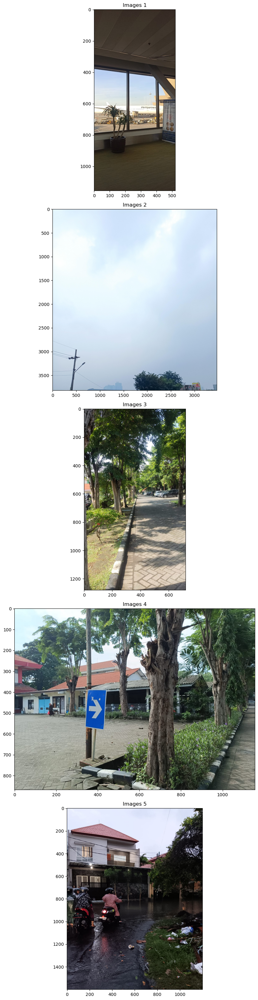

In [5]:
samples = ["citra1.png", "citra2.png", "citra3.png", "citra4.png", "citra5.png"]
images = [np.array(Image.open(img)) for img in samples]
plt.figure(figsize=(50, 32))
for i, img in enumerate(images):
    plt.subplot(len(images),1, i+1)
    plt.imshow(img)
    plt.title(f"Images {i+1}")
plt.tight_layout()
plt.show()

In [5]:
for i, img in enumerate(images):
    print(f"Image {i+1} shape:", img.shape)

Image 1 shape: (1156, 520, 3)
Image 2 shape: (3818, 3472, 3)
Image 3 shape: (1280, 719, 3)
Image 4 shape: (868, 1156, 3)
Image 5 shape: (1600, 1200, 3)


# **Pre-Processing**

In [9]:
%pip install stegano

  Using cached stegano-2.0.0-py3-none-any.whl.metadata (4.3 kB)
  Using cached piexif-1.1.3-py2.py3-none-any.whl.metadata (3.7 kB)
   ---------------------------------------- 0.0/7.0 MB ? eta -:--:--
   ---- ----------------------------------- 0.8/7.0 MB 5.6 MB/s eta 0:00:02
   ------------- -------------------------- 2.4/7.0 MB 5.8 MB/s eta 0:00:01
   ------------------- -------------------- 3.4/7.0 MB 5.9 MB/s eta 0:00:01
   ------------------------ --------------- 4.2/7.0 MB 5.7 MB/s eta 0:00:01
   ------------------------------------ --- 6.3/7.0 MB 6.1 MB/s eta 0:00:01
   ---------------------------------------- 7.0/7.0 MB 5.9 MB/s  0:00:01

  Attempting uninstall: pillow

    Found existing installation: pillow 12.0.0

    Uninstalling pillow-12.0.0:

      Successfully uninstalled pillow-12.0.0

   ---------------------------------------- 0/4 [pillow]
   ---------------------------------------- 0/4 [pillow]
   ---------------------------------------- 0/4 [pillow]
   -------------

   ---------------------------------------- 0.0/7.0 MB ? eta -:--:--
   ------ --------------------------------- 1.0/7.0 MB 7.2 MB/s eta 0:00:01
   ------------- -------------------------- 2.4/7.0 MB 6.4 MB/s eta 0:00:01
   ------------------- -------------------- 3.4/7.0 MB 5.6 MB/s eta 0:00:01
   ---------------------- ----------------- 3.9/7.0 MB 4.6 MB/s eta 0:00:01
   --------------------------- ------------ 4.7/7.0 MB 4.8 MB/s eta 0:00:01
   ------------------------------- -------- 5.5/7.0 MB 4.4 MB/s eta 0:00:01
   ------------------------------------- -- 6.6/7.0 MB 4.4 MB/s eta 0:00:01
   ---------------------------------------- 7.0/7.0 MB 4.4 MB/s  0:00:01
Using cached crayons-0.4.0-py2.py3-none-any.whl (4.6 kB)
Using cached piexif-1.1.3-py2.py3-none-any.whl (20 kB)

  Attempting uninstall: pillow

    Found existing installation: pillow 12.0.0

    Can't uninstall 'pillow'. No files were found to uninstall.

   ---------------------------------------- 0/4 [pillow]
   --------

**Enchanced LSB Analysis**  
The success of this method is supported by the high contrast of the images used. When steganalysis is performed using images with a clear background color or high contrast between the background and the main object, the steganalyst can more easily predict what the enhanced LSB image should look like. On the other hand, for images with low contrast values, such as photographic images, this steganalysis technique becomes more challenging, as the steganalyst will find it difficult to distinguish between the actual image content and the hidden message.  
[Reference](https://informatika.stei.itb.ac.id/~rinaldi.munir/TA/Makalah_TA%20Yulie%20Anneria.pdf)

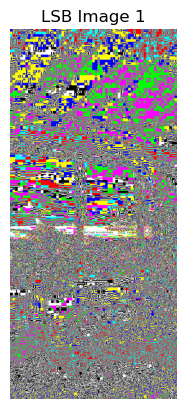

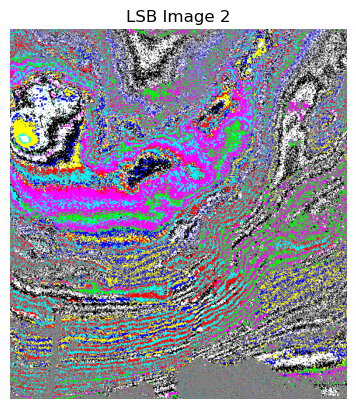

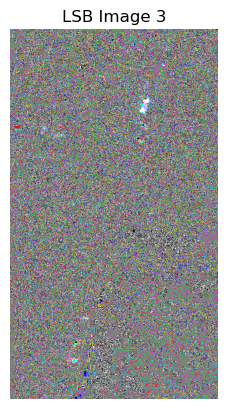

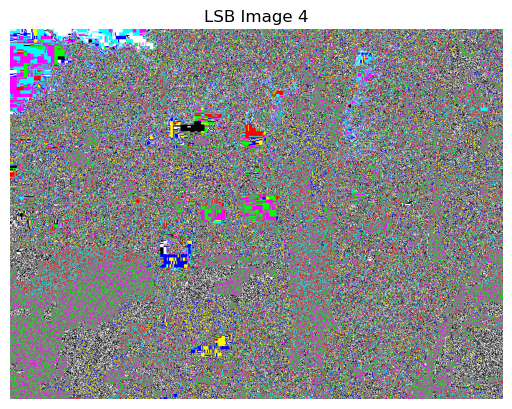

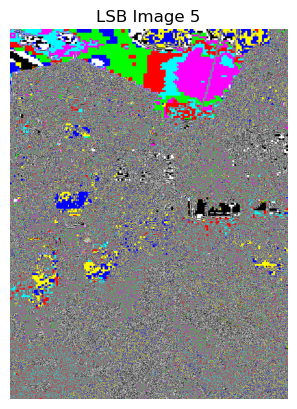

In [6]:
for i, file in enumerate(samples):
    image = np.array(Image.open(file))
    lsb_image = image & 1
    plt.imshow(lsb_image * 255)
    plt.axis('off')
    plt.title(f"LSB Image {i+1}")
    plt.show()

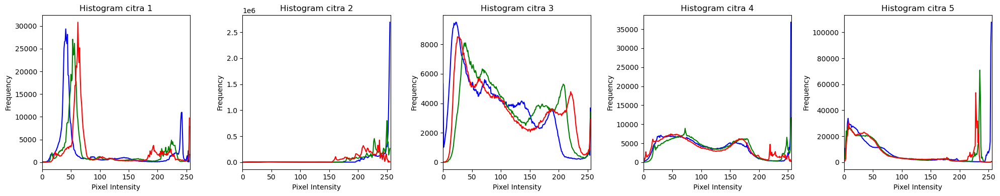

In [ ]:
def show_histogram(image, title):
    color = ('b', 'g', 'r')
    for i, col in enumerate(color):
        histr = cv2.calcHist([image], [i], None, [256], [0, 256])
        plt.plot(histr, color=col)
        plt.xlim([0, 256])
    plt.title(title)
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")

images = [cv2.imread(img) for img in samples]

plt.figure(figsize=(20, 4))
for idx, img in enumerate(images):
    plt.subplot(1, 5, idx + 1)
    show_histogram(img, f"Histogram citra {idx + 1}")
plt.tight_layout()
plt.show()

In [10]:
from stegano import lsb

for i, file in enumerate(samples):
    print(f"\nHidden message for Image {file} with LSB:")
    try:
        hidden_msg = lsb.reveal(file)
        if hidden_msg and hidden_msg.strip():
            print("Hidden message found:")
            print(hidden_msg)
        else:
            print("No hidden message found")
    except Exception as e:
        print("No hidden message found")


Hidden message for Image citra1.png with LSB:
No hidden message found

Hidden message for Image citra2.png with LSB:
No hidden message found

Hidden message for Image citra3.png with LSB:
No hidden message found

Hidden message for Image citra4.png with LSB:
No hidden message found

Hidden message for Image citra5.png with LSB:
No hidden message found


*Inspecting if there are any hidden messages

# **Methods**

## **Steganography with LSB**

In [26]:
import requests
import io

def message_to_binary(message):
    return ''.join([format(ord(i), '08b') for i in message])

def encode_image(file, messages, output_path):
    image = Image.open(file).convert("RGB")
    np_image = np.array(image)

    combined_message = '|'.join(messages) + "#####"
    binary_message = message_to_binary(combined_message)

    binary_index = 0
    data_len = len(binary_message)

    for i in range(np_image.shape[0]):
        for j in range(np_image.shape[1]):
            for k in range(3):
                if binary_index < data_len:
                    pixel = np_image[i, j, k]
                    pixel_bin = format(pixel, '08b')
                    new_pixel_bin = pixel_bin[:-1] + binary_message[binary_index]
                    np_image[i, j, k] = int(new_pixel_bin, 2)
                    binary_index += 1
        if binary_index >= data_len:
            break

    encoded_image = Image.fromarray(np_image)
    encoded_image.save(output_path)
    return image, encoded_image

message = "Perbedaan kelembapan udara di beberapa daerah dan pengaruhnya pada lingkungan, E2,  UNIVERSITAS NEGERI SURABAYA"
message_list = [msg.strip() for msg in message.split(",")]

for i, file in enumerate(samples):
    if os.path.exists(file):
        output_name = f"encoded_image_{i+1}.png"
        encode_image(file, message_list, output_name)
    else:
        print(f"File {file} tidak ditemukan, dilewati.")

In [20]:
import torch
import lpips
from skimage.metrics import peak_signal_noise_ratio as psnr_score, mean_squared_error as mse_score

def binary_to_string(binary_data):
    chars = [binary_data[i:i + 8] for i in range(0, len(binary_data), 8)]
    decoded = ''.join([chr(int(char, 2)) for char in chars])
    return decoded.split("#####")[0]

def decode_and_evaluate(original_image, encoded_image_path):
    encoded_image = Image.open(encoded_image_path).convert("RGB")
    np_encoded = np.array(encoded_image)

    binary_data = ""
    for i in range(np_encoded.shape[0]):
        for j in range(np_encoded.shape[1]):
            for k in range(3): 
                pixel_bin = format(np_encoded[i, j, k], '08b')
                binary_data += pixel_bin[-1]

    hidden_message = binary_to_string(binary_data)

    original_cv = np.array(original_image)
    encoded_cv = np.array(encoded_image)

    mse = mse_score(original_cv, encoded_cv)
    psnrlsb_E2 = psnr_score(original_cv, encoded_cv)
    embedded_bits = len(binary_data)
    height, width, channels = original_cv.shape
    capacity = embedded_bits / (height * width * channels)
    bpp = embedded_bits / (height * width)                  

    loss_fn = lpips.LPIPS(net='alex')
    o_tensor = torch.tensor(np.array(original_image).astype(np.float32) / 255.0).permute(2, 0, 1).unsqueeze(0)
    e_tensor = torch.tensor(np.array(encoded_image).astype(np.float32) / 255.0).permute(2, 0, 1).unsqueeze(0)
    lpips_val = loss_fn(o_tensor, e_tensor).item()

    nc = np.corrcoef(original_cv.flatten(), encoded_cv.flatten())[0, 1]

    print("Hidden message:", hidden_message)
    print(f"Capacity: {capacity}")
    print(f"MSE: {mse:.4f}")
    print(f"PSNR: {psnrlsb_E2:.2f} dB")
    print(f"NC: {nc:.4f}")
    print(f"LPIPS: {lpips_val:.4f}")
    print(f"BPP: {bpp} bits/pixel")

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(original_image)
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    axes[1].imshow(encoded_image)
    axes[1].set_title("Encoded Image")
    axes[1].axis('off')

    plt.show()

*Evaluation Metrics*


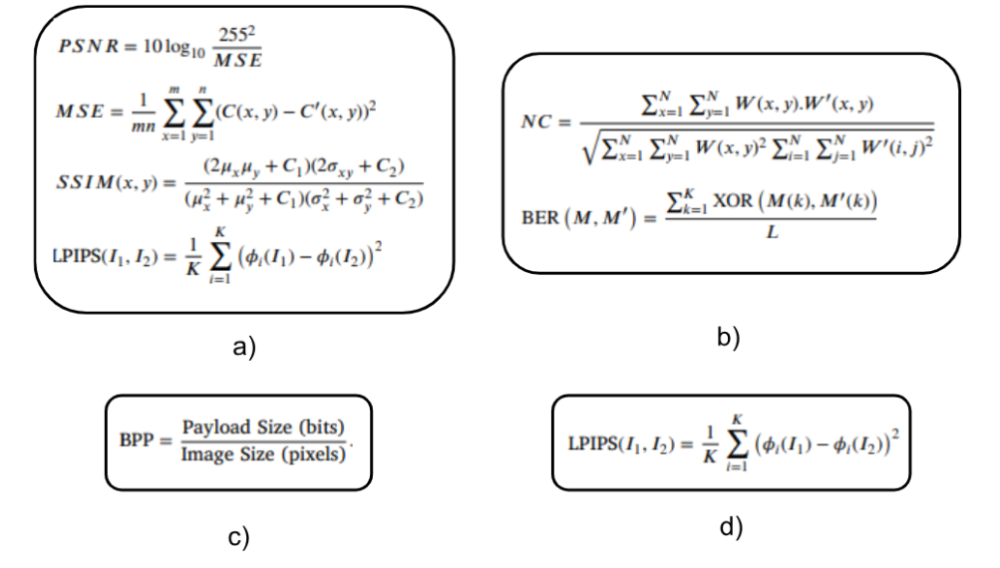

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Users\Thinkpad L13 Yoga\anaconda3\envs\syilit\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Thinkpad L13 Yoga\anaconda3\envs\syilit\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: c:\Users\Thinkpad L13 Yoga\anaconda3\envs\syilit\lib\site-packages\lpips\weights\v0.1\alex.pth


c:\Users\Thinkpad L13 Yoga\anaconda3\envs\syilit\lib\site-packages\lpips\lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_pa

Hidden message: Perbedaan kelembapan udara di beberapa daerah dan pengaruhnya pada lingkungan|E2|UNIVERSITAS NEGERI SURABAYA
Capacity: 1.0
MSE: 0.0002
PSNR: 84.34 dB
NC: 1.0000
LPIPS: 0.0000
BPP: 3.0 bits/pixel


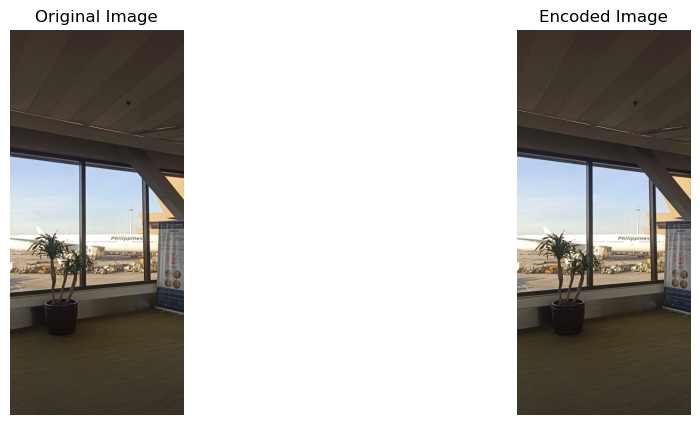

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: c:\Users\Thinkpad L13 Yoga\anaconda3\envs\syilit\lib\site-packages\lpips\weights\v0.1\alex.pth
Hidden message: Perbedaan kelembapan udara di beberapa daerah dan pengaruhnya pada lingkungan|E2|UNIVERSITAS NEGERI SURABAYA
Capacity: 1.0
MSE: 0.0000
PSNR: 97.57 dB
NC: 1.0000
LPIPS: 0.0000
BPP: 3.0 bits/pixel


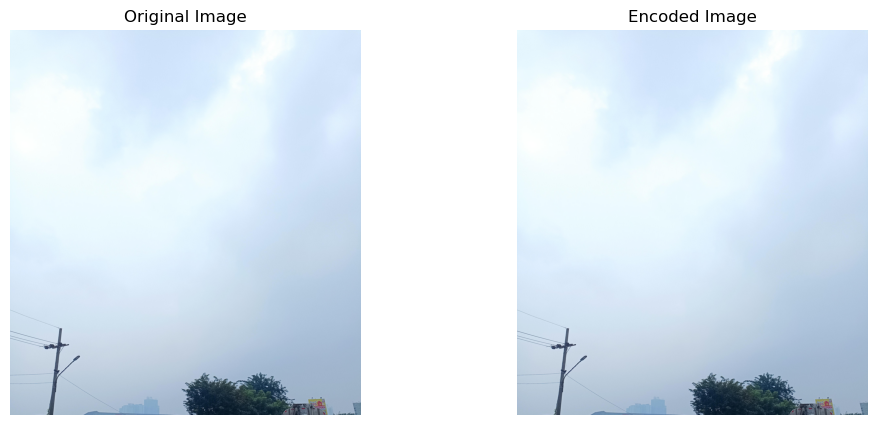

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: c:\Users\Thinkpad L13 Yoga\anaconda3\envs\syilit\lib\site-packages\lpips\weights\v0.1\alex.pth
Hidden message: Perbedaan kelembapan udara di beberapa daerah dan pengaruhnya pada lingkungan|E2|UNIVERSITAS NEGERI SURABAYA
Capacity: 1.0
MSE: 0.0002
PSNR: 86.07 dB
NC: 1.0000
LPIPS: 0.0000
BPP: 3.0 bits/pixel


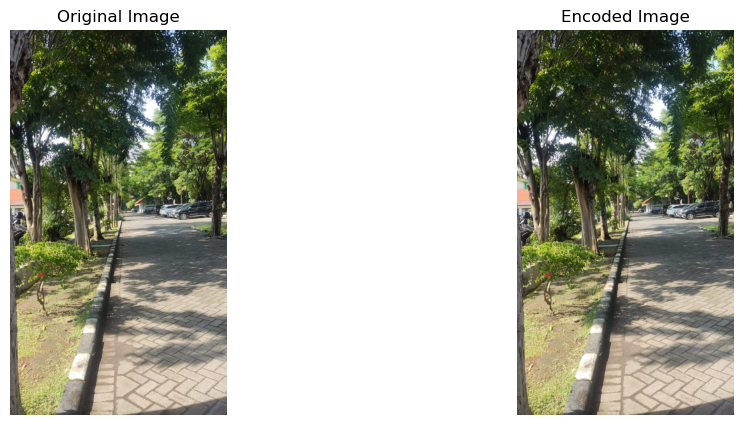

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: c:\Users\Thinkpad L13 Yoga\anaconda3\envs\syilit\lib\site-packages\lpips\weights\v0.1\alex.pth
Hidden message: Perbedaan kelembapan udara di beberapa daerah dan pengaruhnya pada lingkungan|E2|UNIVERSITAS NEGERI SURABAYA
Capacity: 1.0
MSE: 0.0002
PSNR: 86.09 dB
NC: 1.0000
LPIPS: 0.0000
BPP: 3.0 bits/pixel


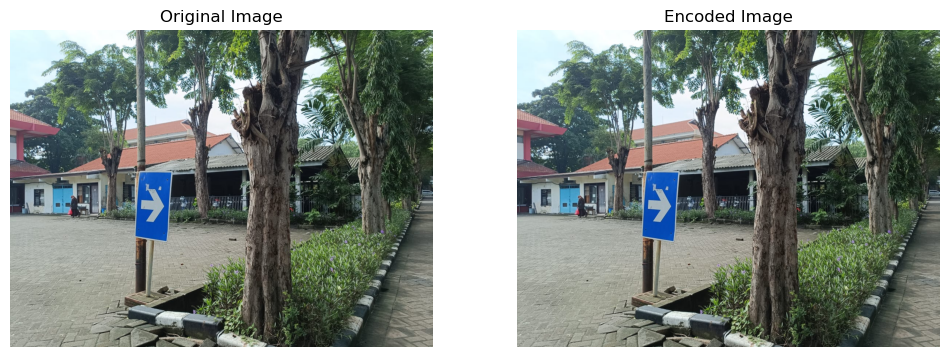

In [25]:
for i in range(1,5):
    original_img=Image.open(f"citra{i}.png").convert("RGB")
    encoded_img_path=f"encoded_image_{i}.png"
    decode_and_evaluate(original_img, encoded_img_path)

## **Steganography with ACO-LSB**

In [27]:
class ACOSteganography:
    def __init__(self, alpha=1.0, beta=1.0, rho=0.1, psi=0.05, ants=50, iterations=100):
        self.alpha = alpha
        self.beta = beta
        self.rho = rho
        self.psi = psi
        self.ants = ants
        self.iterations = iterations
        self.ant_journeys = []

    def calculate_heuristic(self, image):
        sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
        sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
        magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
        magnitude = (magnitude - magnitude.min()) / (magnitude.max() - magnitude.min() + 1e-10)
        return magnitude

    def initialize_pheromone(self, shape):
        return np.ones(shape) * 0.1

    def transition_probability(self, current_pos, neighbor_pos, pheromone, heuristic):
        tau = pheromone[neighbor_pos]
        eta = heuristic[neighbor_pos]
        numerator = (tau ** self.alpha) * (eta ** self.beta)
        denominator = np.sum((pheromone[neighbor_pos] ** self.alpha) * (heuristic[neighbor_pos] ** self.beta))
        if denominator == 0 or np.isnan(denominator):
            return 1e-10
        return numerator / denominator

    def update_pheromone(self, pheromone, heuristic, ant_paths):
        pheromone = (1 - self.rho) * pheromone
        delta_pheromone = np.zeros_like(pheromone)
        for start_pos, end_pos, path in ant_paths:
            for pos in path:
                delta_pheromone[pos] += heuristic[pos]
        pheromone += delta_pheromone
        pheromone = (1 - self.psi) * pheromone + self.psi * self.initialize_pheromone(pheromone.shape)
        return pheromone

    def detect_complex_regions(self, image):
        if len(image.shape) > 2:
            gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        else:
            gray_image = image

        height, width = gray_image.shape
        heuristic = self.calculate_heuristic(gray_image)
        pheromone = self.initialize_pheromone(gray_image.shape)
        self.ant_journeys = []
        for _ in tqdm(range(self.iterations), desc="ACO Optimization"):
            ant_paths = []
            for _ in range(self.ants):
                x, y = np.random.randint(0, width), np.random.randint(0, height)
                path = [(y, x)]
                for __ in range(100):
                    neighbors = []
                    probabilities = []
                    for dy in [-1, 0, 1]:
                        for dx in [-1, 0, 1]:
                            if dx == 0 and dy == 0:
                                continue
                            ny, nx = y + dy, x + dx
                            if 0 <= nx < width and 0 <= ny < height:
                                neighbors.append((ny, nx))
                                prob = self.transition_probability((y, x), (ny, nx), pheromone, heuristic)
                                probabilities.append(prob)
                    if not neighbors:
                        break
                    probabilities = np.array(probabilities)
                    prob_sum = probabilities.sum()
                    if prob_sum == 0 or np.isnan(prob_sum):
                        probabilities = np.ones_like(probabilities) / len(probabilities)
                    else:
                        probabilities /= prob_sum
                    next_idx = np.random.choice(len(neighbors), p=probabilities)
                    y, x = neighbors[next_idx]
                    path.append((y, x))
                start_pos = path[0]
                end_pos = path[-1]
                ant_paths.append((start_pos, end_pos, path))
            self.ant_journeys = [(start, end) for start, end, _ in ant_paths]
            pheromone = self.update_pheromone(pheromone, heuristic, ant_paths)

        threshold = np.mean(pheromone) * 1.2
        complex_region = (pheromone >= threshold).astype(np.uint8)
        return complex_region, pheromone

    def embed_message(self, cover_image, secret_message, complex_region=None, seed_key=None):
        if complex_region is None:
            complex_region, _ = self.detect_complex_regions(cover_image)

        if isinstance(secret_message, str):
            secret_bits = ''.join(format(ord(c), '08b') for c in secret_message)
        else:
            secret_bits = ''.join(format(b, '08b') for b in secret_message)
        secret_bits = [int(b) for b in secret_bits]

        message_length = len(secret_bits)
        length_bits = [int(b) for b in format(message_length, '016b')]
        secret_bits = length_bits + secret_bits

        secret_idx = 0
        stego_image = cover_image.copy()
        if len(stego_image.shape) == 2:
            stego_image = np.expand_dims(stego_image, axis=-1)
        height, width, channels = stego_image.shape
        total_bits = len(secret_bits)
        embedded_bits = 0

        complex_positions = [(y, x) for y in range(height) for x in range(width) if complex_region[y, x] == 1]
        non_complex_positions = [(y, x) for y in range(height) for x in range(width) if complex_region[y, x] == 0]
        if seed_key is not None:
            np.random.seed(hash(seed_key) % 2**32)
        np.random.shuffle(complex_positions)
        np.random.shuffle(non_complex_positions)
        positions = complex_positions + non_complex_positions

        available_bits = len(complex_positions) * channels
        if available_bits < total_bits:
            print(f"Warning: Complex region capacity ({available_bits} bits) insufficient. Using non-complex pixels.")

        for pos in positions:
            y, x = pos
            for c in range(channels):
                if secret_idx >= total_bits:
                    break
                pixel_val = stego_image[y, x, c]
                bit_to_embed = secret_bits[secret_idx]
                current_lsb = pixel_val & 1
                if current_lsb != bit_to_embed:
                    stego_image[y, x, c] = (pixel_val & 0xFE) | bit_to_embed
                secret_idx += 1
                embedded_bits += 1
            if secret_idx >= total_bits:
                break

        capacity = embedded_bits / (height * width * channels)
        return stego_image.squeeze(), capacity

    def extract_message(self, stego_image, complex_region, seed_key=None):
        if len(stego_image.shape) == 2:
            stego_image = np.expand_dims(stego_image, axis=-1)
        height, width, channels = stego_image.shape
        extracted_bits = []

        complex_positions = [(y, x) for y in range(height) for x in range(width) if complex_region[y, x] == 1]
        non_complex_positions = [(y, x) for y in range(height) for x in range(width) if complex_region[y, x] == 0]
        if seed_key is not None:
            np.random.seed(hash(seed_key) % 2**32)
        np.random.shuffle(complex_positions)
        np.random.shuffle(non_complex_positions)
        positions = complex_positions + non_complex_positions

        secret_idx = 0
        for pos in positions:
            y, x = pos
            for c in range(channels):
                pixel_val = stego_image[y, x, c]
                extracted_bits.append(pixel_val & 1)
                secret_idx += 1
                if secret_idx >= 16 + 10000:
                    break
            if secret_idx >= 16 + 10000:
                break

        if len(extracted_bits) < 16:
            print("Error: Could not extract length bits")
            return b''

        length_bits = extracted_bits[:16]
        message_length = int(''.join(map(str, length_bits)), 2)

        if len(extracted_bits) < 16 + message_length:
            print(f"Error: Extracted {len(extracted_bits) - 16} bits, but need {message_length}")
            return b''

        message_bits = extracted_bits[16:16 + message_length]
        message_bytes = []
        for i in range(0, len(message_bits), 8):
            byte_bits = message_bits[i:i+8]
            if len(byte_bits) == 8:
                byte = int(''.join(map(str, byte_bits)), 2)
                message_bytes.append(byte)

        return bytes(message_bytes)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: c:\Users\Thinkpad L13 Yoga\anaconda3\envs\syilit\lib\site-packages\lpips\weights\v0.1\alex.pth

=== Testing citra1.png with 10 ants ===


ACO Optimization: 100%|██████████| 100/100 [00:12<00:00,  8.22it/s]


Complex pixels: 4097
Ant Journeys (start_pos -> end_pos):
Ant 1: (765, 270) -> (780, 274)
Ant 2: (502, 163) -> (502, 161)
Ant 3: (237, 356) -> (254, 358)
Ant 4: (1106, 235) -> (1128, 246)
Ant 5: (97, 91) -> (86, 96)
Ant 6: (276, 443) -> (284, 440)
Ant 7: (923, 183) -> (911, 160)
Ant 8: (462, 110) -> (455, 108)
Ant 9: (145, 129) -> (143, 126)
Ant 10: (674, 26) -> (679, 24)
Stego image saved as: citra1_stego_10.jpg


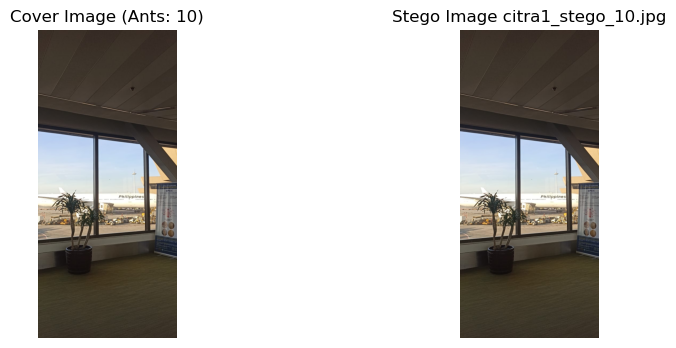

Evaluation Metrics for citra1_stego_10.jpg:
Capacity       : 0.0005
PSNR (dB)      : 84.07
MSE            : 0.0003
NC             : 1.0000
BPP            : 0.0005
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra1.png with 30 ants ===


ACO Optimization: 100%|██████████| 100/100 [00:34<00:00,  2.89it/s]


Complex pixels: 11882
Ant Journeys (start_pos -> end_pos):
Ant 1: (631, 59) -> (625, 66)
Ant 2: (253, 217) -> (252, 215)
Ant 3: (424, 352) -> (425, 359)
Ant 4: (667, 333) -> (669, 329)
Ant 5: (1146, 448) -> (1152, 440)
Ant 6: (549, 10) -> (552, 2)
Ant 7: (122, 9) -> (111, 1)
Ant 8: (191, 63) -> (187, 55)
Ant 9: (1008, 481) -> (1002, 495)
Ant 10: (695, 14) -> (701, 15)
Ant 11: (146, 254) -> (141, 244)
Ant 12: (547, 242) -> (565, 236)
Ant 13: (695, 489) -> (694, 486)
Ant 14: (540, 304) -> (539, 313)
Ant 15: (450, 75) -> (451, 86)
Ant 16: (208, 204) -> (204, 211)
Ant 17: (759, 316) -> (756, 313)
Ant 18: (246, 474) -> (237, 492)
Ant 19: (498, 67) -> (504, 62)
Ant 20: (363, 479) -> (375, 484)
Ant 21: (63, 30) -> (54, 16)
Ant 22: (225, 155) -> (233, 159)
Ant 23: (577, 141) -> (579, 142)
Ant 24: (70, 211) -> (76, 208)
Ant 25: (203, 57) -> (220, 65)
Ant 26: (1034, 167) -> (1043, 164)
Ant 27: (1048, 299) -> (1045, 285)
Ant 28: (458, 69) -> (459, 70)
Ant 29: (703, 143) -> (704, 153)
Ant 30: (106

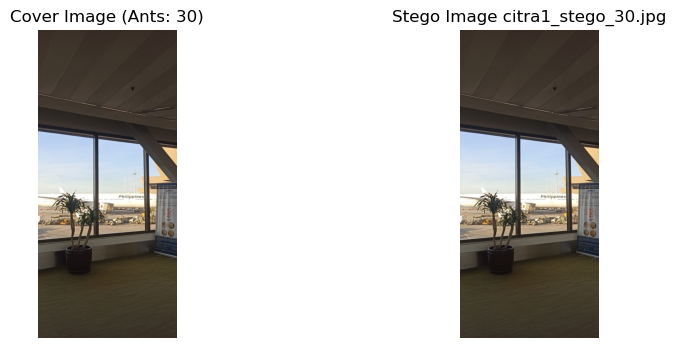

Evaluation Metrics for citra1_stego_30.jpg:
Capacity       : 0.0005
PSNR (dB)      : 84.38
MSE            : 0.0002
NC             : 1.0000
BPP            : 0.0005
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra1.png with 50 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:01<00:00,  1.61it/s]


Complex pixels: 17799
Ant Journeys (start_pos -> end_pos):
Ant 1: (584, 191) -> (582, 195)
Ant 2: (438, 283) -> (447, 286)
Ant 3: (650, 428) -> (649, 424)
Ant 4: (691, 350) -> (679, 348)
Ant 5: (291, 406) -> (277, 386)
Ant 6: (1018, 234) -> (1018, 233)
Ant 7: (1086, 339) -> (1085, 344)
Ant 8: (1126, 360) -> (1118, 363)
Ant 9: (947, 91) -> (951, 76)
Ant 10: (160, 119) -> (159, 112)
Ant 11: (135, 11) -> (131, 1)
Ant 12: (711, 48) -> (687, 42)
Ant 13: (284, 33) -> (274, 30)
Ant 14: (850, 143) -> (844, 136)
Ant 15: (682, 455) -> (678, 454)
Ant 16: (404, 302) -> (410, 305)
Ant 17: (138, 161) -> (138, 158)
Ant 18: (784, 25) -> (771, 28)
Ant 19: (668, 160) -> (661, 154)
Ant 20: (727, 282) -> (731, 262)
Ant 21: (1108, 73) -> (1110, 85)
Ant 22: (1155, 392) -> (1141, 402)
Ant 23: (960, 450) -> (968, 458)
Ant 24: (1147, 132) -> (1150, 128)
Ant 25: (764, 3) -> (785, 2)
Ant 26: (15, 360) -> (20, 360)
Ant 27: (963, 455) -> (960, 457)
Ant 28: (1092, 0) -> (1094, 4)
Ant 29: (679, 24) -> (676, 40)
Ant 

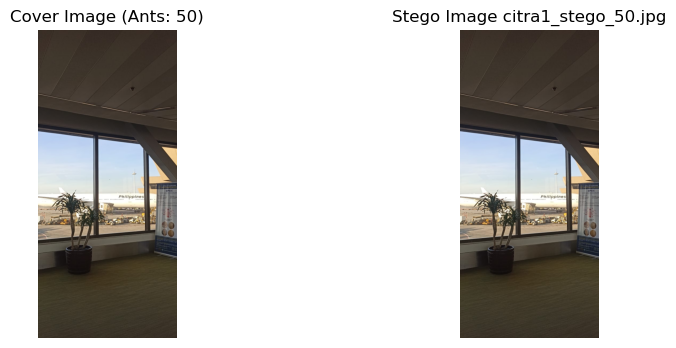

Evaluation Metrics for citra1_stego_50.jpg:
Capacity       : 0.0005
PSNR (dB)      : 84.04
MSE            : 0.0003
NC             : 1.0000
BPP            : 0.0005
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra1.png with 70 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:20<00:00,  1.24it/s]


Complex pixels: 22172
Ant Journeys (start_pos -> end_pos):
Ant 1: (1113, 243) -> (1110, 232)
Ant 2: (290, 149) -> (299, 145)
Ant 3: (156, 453) -> (155, 456)
Ant 4: (1026, 350) -> (1011, 354)
Ant 5: (743, 222) -> (741, 234)
Ant 6: (938, 114) -> (931, 112)
Ant 7: (318, 7) -> (309, 16)
Ant 8: (478, 13) -> (479, 4)
Ant 9: (900, 182) -> (891, 192)
Ant 10: (705, 92) -> (707, 104)
Ant 11: (845, 417) -> (834, 410)
Ant 12: (434, 239) -> (429, 231)
Ant 13: (275, 120) -> (256, 115)
Ant 14: (821, 70) -> (825, 69)
Ant 15: (412, 247) -> (417, 243)
Ant 16: (183, 483) -> (190, 485)
Ant 17: (860, 115) -> (865, 121)
Ant 18: (1134, 305) -> (1136, 322)
Ant 19: (759, 28) -> (773, 27)
Ant 20: (969, 207) -> (963, 195)
Ant 21: (850, 342) -> (837, 355)
Ant 22: (855, 419) -> (853, 430)
Ant 23: (881, 326) -> (892, 332)
Ant 24: (822, 84) -> (815, 77)
Ant 25: (314, 31) -> (311, 31)
Ant 26: (1049, 166) -> (1043, 159)
Ant 27: (366, 470) -> (360, 478)
Ant 28: (1039, 479) -> (1025, 473)
Ant 29: (222, 465) -> (231, 467

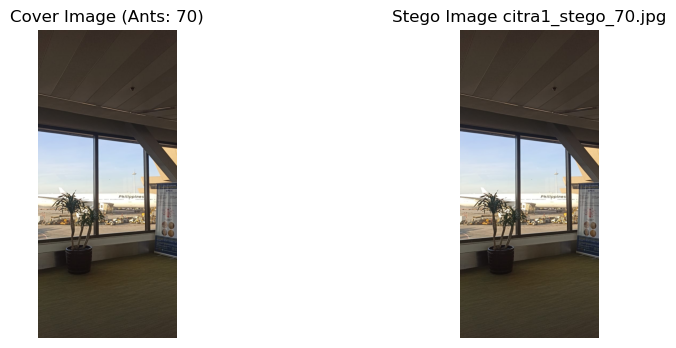

Evaluation Metrics for citra1_stego_70.jpg:
Capacity       : 0.0005
PSNR (dB)      : 84.37
MSE            : 0.0002
NC             : 1.0000
BPP            : 0.0005
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra1.png with 100 ants ===


ACO Optimization: 100%|██████████| 100/100 [02:18<00:00,  1.39s/it]


Complex pixels: 29533
Ant Journeys (start_pos -> end_pos):
Ant 1: (134, 329) -> (122, 331)
Ant 2: (957, 495) -> (959, 506)
Ant 3: (952, 204) -> (952, 214)
Ant 4: (367, 110) -> (363, 98)
Ant 5: (1142, 215) -> (1149, 213)
Ant 6: (700, 501) -> (702, 504)
Ant 7: (801, 102) -> (798, 98)
Ant 8: (583, 106) -> (581, 117)
Ant 9: (181, 162) -> (194, 156)
Ant 10: (927, 34) -> (927, 32)
Ant 11: (425, 339) -> (428, 352)
Ant 12: (858, 52) -> (855, 69)
Ant 13: (360, 385) -> (357, 383)
Ant 14: (1060, 271) -> (1063, 254)
Ant 15: (123, 236) -> (118, 239)
Ant 16: (927, 302) -> (928, 317)
Ant 17: (42, 1) -> (43, 10)
Ant 18: (596, 301) -> (601, 287)
Ant 19: (735, 380) -> (724, 379)
Ant 20: (137, 164) -> (126, 157)
Ant 21: (3, 191) -> (6, 189)
Ant 22: (5, 24) -> (15, 14)
Ant 23: (83, 113) -> (79, 111)
Ant 24: (194, 342) -> (194, 336)
Ant 25: (776, 8) -> (769, 7)
Ant 26: (256, 417) -> (253, 423)
Ant 27: (444, 145) -> (453, 135)
Ant 28: (206, 56) -> (205, 61)
Ant 29: (681, 33) -> (667, 34)
Ant 30: (1150, 256)

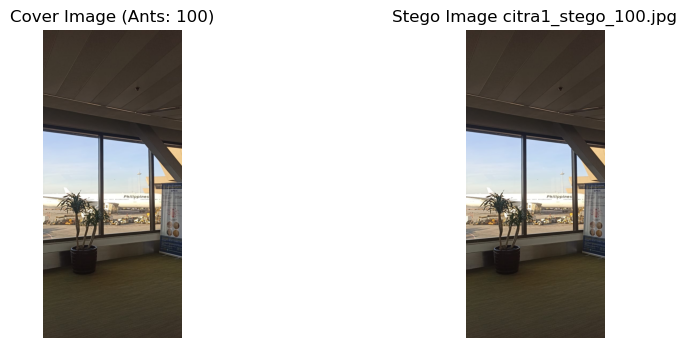

Evaluation Metrics for citra1_stego_100.jpg:
Capacity       : 0.0005
PSNR (dB)      : 84.30
MSE            : 0.0002
NC             : 1.0000
BPP            : 0.0005
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra2.png with 10 ants ===


ACO Optimization: 100%|██████████| 100/100 [00:36<00:00,  2.71it/s]


Complex pixels: 2472
Ant Journeys (start_pos -> end_pos):
Ant 1: (361, 2273) -> (379, 2264)
Ant 2: (3588, 1199) -> (3596, 1199)
Ant 3: (3138, 232) -> (3136, 241)
Ant 4: (2994, 1784) -> (2991, 1792)
Ant 5: (1, 2042) -> (15, 2041)
Ant 6: (3676, 1402) -> (3679, 1400)
Ant 7: (2221, 5) -> (2220, 12)
Ant 8: (1788, 1848) -> (1776, 1858)
Ant 9: (3099, 183) -> (3096, 195)
Ant 10: (2741, 3082) -> (2738, 3080)
Stego image saved as: citra2_stego_10.jpg


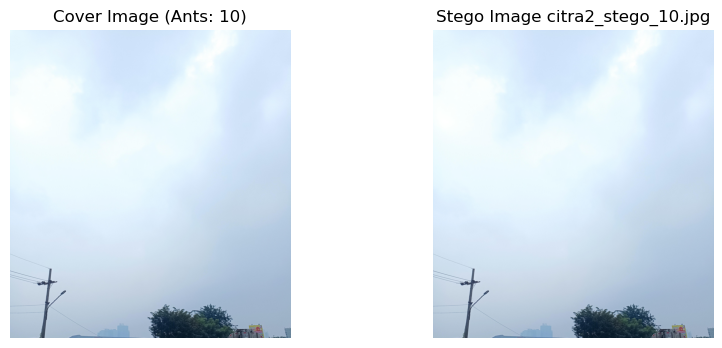

Evaluation Metrics for citra2_stego_10.jpg:
Capacity       : 0.0000
PSNR (dB)      : 97.56
MSE            : 0.0000
NC             : 1.0000
BPP            : 0.0000
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra2.png with 30 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:04<00:00,  1.54it/s]


Complex pixels: 6374
Ant Journeys (start_pos -> end_pos):
Ant 1: (776, 1953) -> (773, 1950)
Ant 2: (1785, 3036) -> (1783, 3029)
Ant 3: (76, 1888) -> (67, 1879)
Ant 4: (1872, 1251) -> (1880, 1238)
Ant 5: (1325, 1642) -> (1328, 1634)
Ant 6: (1577, 1611) -> (1565, 1608)
Ant 7: (2617, 1147) -> (2627, 1148)
Ant 8: (3342, 224) -> (3343, 224)
Ant 9: (2066, 1277) -> (2053, 1256)
Ant 10: (394, 298) -> (403, 310)
Ant 11: (1687, 2857) -> (1705, 2856)
Ant 12: (3066, 1605) -> (3061, 1610)
Ant 13: (812, 116) -> (815, 110)
Ant 14: (1094, 790) -> (1088, 785)
Ant 15: (434, 2270) -> (432, 2277)
Ant 16: (1215, 1243) -> (1217, 1240)
Ant 17: (1485, 1062) -> (1484, 1071)
Ant 18: (3088, 3185) -> (3095, 3200)
Ant 19: (2791, 2173) -> (2805, 2173)
Ant 20: (3782, 1335) -> (3791, 1350)
Ant 21: (2696, 1543) -> (2699, 1544)
Ant 22: (2775, 3143) -> (2768, 3146)
Ant 23: (3594, 3114) -> (3604, 3107)
Ant 24: (3122, 662) -> (3122, 672)
Ant 25: (3812, 925) -> (3815, 921)
Ant 26: (76, 1088) -> (70, 1068)
Ant 27: (630, 854

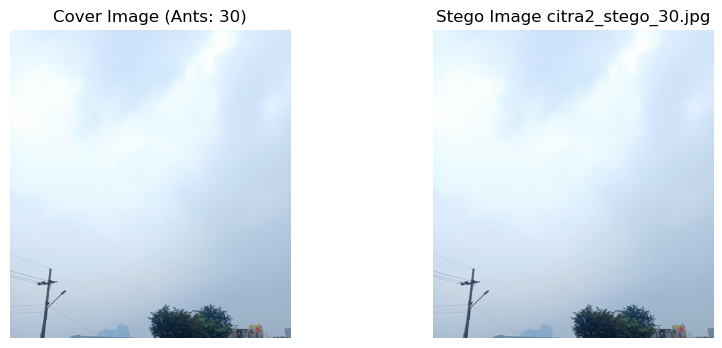

Evaluation Metrics for citra2_stego_30.jpg:
Capacity       : 0.0000
PSNR (dB)      : 97.59
MSE            : 0.0000
NC             : 1.0000
BPP            : 0.0000
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra2.png with 50 ants ===


ACO Optimization: 100%|██████████| 100/100 [02:01<00:00,  1.21s/it]


Complex pixels: 10340
Ant Journeys (start_pos -> end_pos):
Ant 1: (2866, 1507) -> (2886, 1507)
Ant 2: (2529, 1040) -> (2525, 1031)
Ant 3: (30, 3090) -> (23, 3080)
Ant 4: (2607, 1106) -> (2606, 1112)
Ant 5: (2233, 855) -> (2236, 863)
Ant 6: (1827, 3248) -> (1819, 3249)
Ant 7: (774, 3386) -> (775, 3389)
Ant 8: (239, 1019) -> (226, 1028)
Ant 9: (1422, 516) -> (1439, 518)
Ant 10: (1014, 2254) -> (1007, 2255)
Ant 11: (1447, 343) -> (1451, 348)
Ant 12: (3144, 1513) -> (3142, 1512)
Ant 13: (1097, 1539) -> (1096, 1544)
Ant 14: (1281, 3161) -> (1282, 3168)
Ant 15: (1277, 1109) -> (1278, 1112)
Ant 16: (3017, 2495) -> (3014, 2496)
Ant 17: (349, 3079) -> (360, 3074)
Ant 18: (893, 809) -> (896, 811)
Ant 19: (1282, 690) -> (1268, 689)
Ant 20: (2857, 466) -> (2861, 451)
Ant 21: (3293, 309) -> (3283, 312)
Ant 22: (1352, 470) -> (1348, 477)
Ant 23: (2798, 3011) -> (2789, 3024)
Ant 24: (915, 41) -> (911, 38)
Ant 25: (931, 2053) -> (936, 2055)
Ant 26: (683, 1190) -> (687, 1186)
Ant 27: (1744, 2064) -> (1

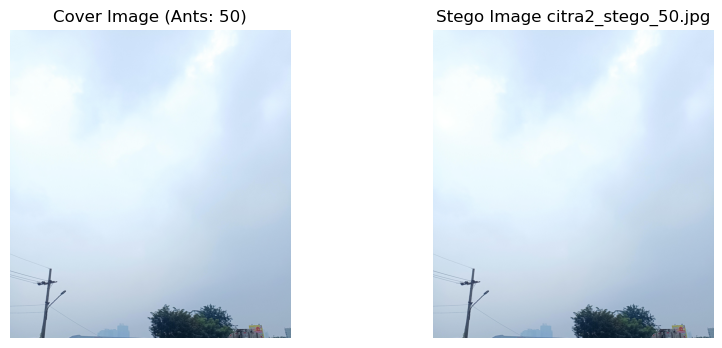

Evaluation Metrics for citra2_stego_50.jpg:
Capacity       : 0.0000
PSNR (dB)      : 97.44
MSE            : 0.0000
NC             : 1.0000
BPP            : 0.0000
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra2.png with 70 ants ===


ACO Optimization: 100%|██████████| 100/100 [02:37<00:00,  1.58s/it]


Complex pixels: 14484
Ant Journeys (start_pos -> end_pos):
Ant 1: (43, 2145) -> (39, 2151)
Ant 2: (1204, 766) -> (1207, 767)
Ant 3: (579, 3230) -> (562, 3233)
Ant 4: (1388, 981) -> (1383, 969)
Ant 5: (213, 2311) -> (226, 2299)
Ant 6: (2303, 495) -> (2305, 495)
Ant 7: (509, 244) -> (515, 238)
Ant 8: (2182, 2316) -> (2178, 2317)
Ant 9: (439, 2366) -> (453, 2344)
Ant 10: (3075, 3154) -> (3081, 3154)
Ant 11: (1237, 2428) -> (1232, 2427)
Ant 12: (1715, 1321) -> (1719, 1313)
Ant 13: (2516, 1485) -> (2514, 1488)
Ant 14: (2237, 440) -> (2240, 441)
Ant 15: (3056, 1160) -> (3049, 1167)
Ant 16: (367, 948) -> (357, 960)
Ant 17: (2616, 1600) -> (2616, 1592)
Ant 18: (842, 2224) -> (866, 2219)
Ant 19: (2947, 1993) -> (2936, 2005)
Ant 20: (1264, 2311) -> (1260, 2312)
Ant 21: (815, 533) -> (810, 535)
Ant 22: (925, 3233) -> (929, 3228)
Ant 23: (3327, 2477) -> (3334, 2475)
Ant 24: (3196, 2031) -> (3199, 2040)
Ant 25: (895, 1322) -> (895, 1315)
Ant 26: (3510, 2389) -> (3500, 2391)
Ant 27: (1302, 1296) -> 

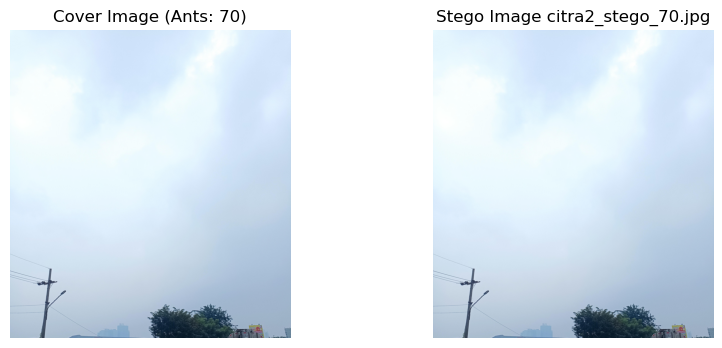

Evaluation Metrics for citra2_stego_70.jpg:
Capacity       : 0.0000
PSNR (dB)      : 97.28
MSE            : 0.0000
NC             : 1.0000
BPP            : 0.0000
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra2.png with 100 ants ===


ACO Optimization: 100%|██████████| 100/100 [02:51<00:00,  1.72s/it]


Complex pixels: 21391
Ant Journeys (start_pos -> end_pos):
Ant 1: (1152, 1544) -> (1152, 1536)
Ant 2: (1906, 3206) -> (1901, 3200)
Ant 3: (3648, 1572) -> (3646, 1573)
Ant 4: (2539, 86) -> (2523, 93)
Ant 5: (555, 1985) -> (556, 1982)
Ant 6: (3619, 2947) -> (3628, 2933)
Ant 7: (455, 1337) -> (455, 1342)
Ant 8: (2834, 1599) -> (2840, 1596)
Ant 9: (417, 3250) -> (421, 3257)
Ant 10: (2788, 2364) -> (2800, 2360)
Ant 11: (2054, 897) -> (2064, 888)
Ant 12: (3238, 1572) -> (3239, 1571)
Ant 13: (764, 2339) -> (755, 2340)
Ant 14: (193, 2946) -> (192, 2939)
Ant 15: (1845, 3000) -> (1841, 3011)
Ant 16: (1976, 2392) -> (1967, 2395)
Ant 17: (2135, 24) -> (2141, 18)
Ant 18: (1122, 234) -> (1118, 225)
Ant 19: (2411, 278) -> (2413, 278)
Ant 20: (3125, 261) -> (3131, 267)
Ant 21: (2886, 1225) -> (2879, 1230)
Ant 22: (3122, 1972) -> (3121, 1992)
Ant 23: (940, 308) -> (948, 309)
Ant 24: (1237, 1327) -> (1232, 1342)
Ant 25: (2, 1063) -> (1, 1072)
Ant 26: (1167, 217) -> (1167, 221)
Ant 27: (407, 2321) -> (40

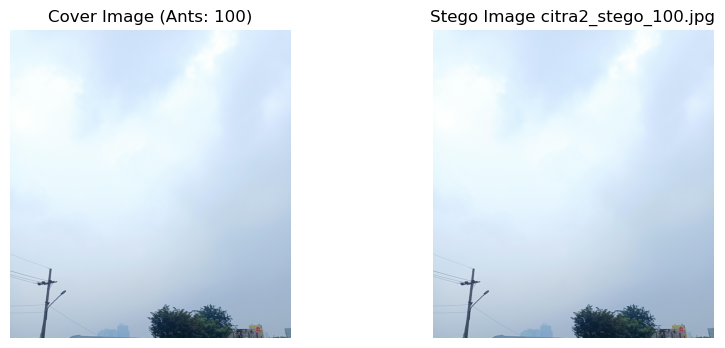

Evaluation Metrics for citra2_stego_100.jpg:
Capacity       : 0.0000
PSNR (dB)      : 97.54
MSE            : 0.0000
NC             : 1.0000
BPP            : 0.0000
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra3.png with 10 ants ===


ACO Optimization: 100%|██████████| 100/100 [00:14<00:00,  6.99it/s]


Complex pixels: 9993
Ant Journeys (start_pos -> end_pos):
Ant 1: (1063, 407) -> (1057, 404)
Ant 2: (222, 644) -> (208, 636)
Ant 3: (533, 86) -> (530, 85)
Ant 4: (1227, 210) -> (1221, 199)
Ant 5: (628, 382) -> (633, 391)
Ant 6: (414, 597) -> (414, 592)
Ant 7: (926, 418) -> (926, 432)
Ant 8: (217, 546) -> (215, 550)
Ant 9: (611, 380) -> (612, 385)
Ant 10: (283, 515) -> (292, 509)
Stego image saved as: citra3_stego_10.jpg


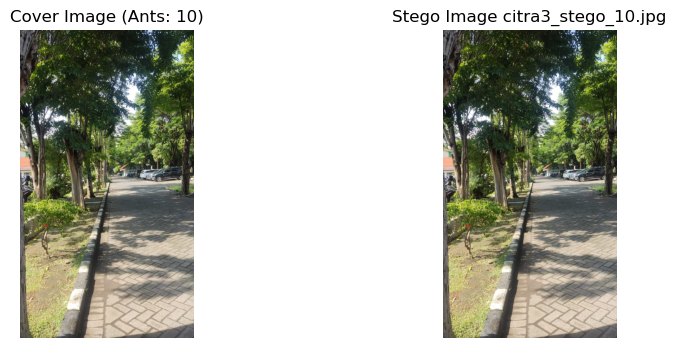

Evaluation Metrics for citra3_stego_10.jpg:
Capacity       : 0.0003
PSNR (dB)      : 85.91
MSE            : 0.0002
NC             : 1.0000
BPP            : 0.0003
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra3.png with 30 ants ===


ACO Optimization: 100%|██████████| 100/100 [00:41<00:00,  2.42it/s]


Complex pixels: 26796
Ant Journeys (start_pos -> end_pos):
Ant 1: (24, 622) -> (26, 618)
Ant 2: (235, 39) -> (242, 48)
Ant 3: (136, 449) -> (134, 450)
Ant 4: (1214, 440) -> (1226, 436)
Ant 5: (233, 34) -> (219, 47)
Ant 6: (983, 433) -> (990, 439)
Ant 7: (422, 165) -> (416, 161)
Ant 8: (1255, 347) -> (1257, 345)
Ant 9: (547, 323) -> (555, 323)
Ant 10: (462, 172) -> (462, 171)
Ant 11: (122, 611) -> (122, 601)
Ant 12: (243, 360) -> (247, 353)
Ant 13: (125, 588) -> (118, 595)
Ant 14: (423, 707) -> (426, 691)
Ant 15: (1038, 522) -> (1045, 518)
Ant 16: (1183, 75) -> (1185, 70)
Ant 17: (1208, 396) -> (1210, 395)
Ant 18: (644, 614) -> (632, 594)
Ant 19: (586, 122) -> (577, 137)
Ant 20: (598, 36) -> (593, 42)
Ant 21: (538, 715) -> (534, 716)
Ant 22: (746, 689) -> (748, 685)
Ant 23: (322, 205) -> (327, 215)
Ant 24: (1037, 241) -> (1040, 233)
Ant 25: (99, 145) -> (97, 139)
Ant 26: (216, 48) -> (224, 68)
Ant 27: (79, 76) -> (105, 72)
Ant 28: (239, 179) -> (229, 180)
Ant 29: (734, 495) -> (722, 495

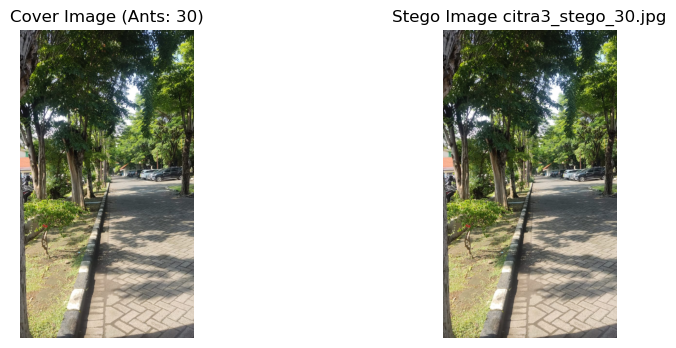

Evaluation Metrics for citra3_stego_30.jpg:
Capacity       : 0.0003
PSNR (dB)      : 86.07
MSE            : 0.0002
NC             : 1.0000
BPP            : 0.0003
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra3.png with 50 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Complex pixels: 42435
Ant Journeys (start_pos -> end_pos):
Ant 1: (268, 269) -> (273, 268)
Ant 2: (272, 557) -> (272, 538)
Ant 3: (850, 72) -> (856, 66)
Ant 4: (222, 107) -> (226, 104)
Ant 5: (9, 320) -> (21, 314)
Ant 6: (1076, 250) -> (1078, 252)
Ant 7: (993, 710) -> (1004, 706)
Ant 8: (919, 368) -> (921, 364)
Ant 9: (1077, 193) -> (1081, 188)
Ant 10: (1098, 256) -> (1102, 258)
Ant 11: (126, 411) -> (135, 414)
Ant 12: (517, 710) -> (505, 717)
Ant 13: (32, 307) -> (18, 302)
Ant 14: (1093, 398) -> (1108, 408)
Ant 15: (798, 356) -> (785, 347)
Ant 16: (1259, 539) -> (1238, 538)
Ant 17: (643, 352) -> (641, 346)
Ant 18: (551, 702) -> (557, 699)
Ant 19: (672, 310) -> (677, 300)
Ant 20: (607, 367) -> (599, 348)
Ant 21: (537, 34) -> (537, 33)
Ant 22: (562, 666) -> (559, 654)
Ant 23: (695, 438) -> (705, 444)
Ant 24: (639, 101) -> (625, 96)
Ant 25: (204, 552) -> (200, 546)
Ant 26: (793, 237) -> (799, 226)
Ant 27: (297, 385) -> (289, 391)
Ant 28: (366, 521) -> (376, 527)
Ant 29: (1180, 564) -> (1

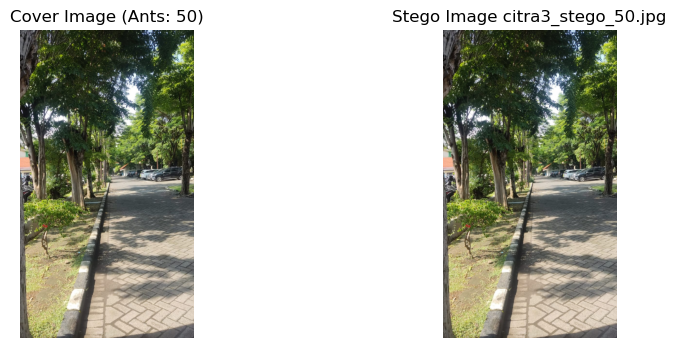

Evaluation Metrics for citra3_stego_50.jpg:
Capacity       : 0.0003
PSNR (dB)      : 85.87
MSE            : 0.0002
NC             : 1.0000
BPP            : 0.0003
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra3.png with 70 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:39<00:00,  1.00it/s]


Complex pixels: 54377
Ant Journeys (start_pos -> end_pos):
Ant 1: (240, 312) -> (255, 304)
Ant 2: (986, 523) -> (978, 525)
Ant 3: (279, 1) -> (270, 6)
Ant 4: (46, 125) -> (66, 133)
Ant 5: (184, 522) -> (189, 525)
Ant 6: (406, 628) -> (404, 645)
Ant 7: (459, 370) -> (458, 366)
Ant 8: (445, 285) -> (435, 272)
Ant 9: (300, 257) -> (305, 255)
Ant 10: (1033, 358) -> (1018, 369)
Ant 11: (445, 235) -> (464, 238)
Ant 12: (1154, 510) -> (1155, 507)
Ant 13: (716, 593) -> (713, 590)
Ant 14: (743, 551) -> (754, 566)
Ant 15: (882, 169) -> (880, 170)
Ant 16: (8, 118) -> (9, 122)
Ant 17: (514, 335) -> (523, 342)
Ant 18: (182, 37) -> (176, 40)
Ant 19: (614, 202) -> (610, 206)
Ant 20: (636, 189) -> (631, 190)
Ant 21: (1183, 343) -> (1187, 330)
Ant 22: (298, 106) -> (306, 97)
Ant 23: (251, 111) -> (252, 98)
Ant 24: (59, 84) -> (64, 73)
Ant 25: (487, 517) -> (493, 517)
Ant 26: (501, 543) -> (492, 535)
Ant 27: (1109, 182) -> (1122, 180)
Ant 28: (208, 541) -> (208, 549)
Ant 29: (191, 686) -> (197, 706)
Ant

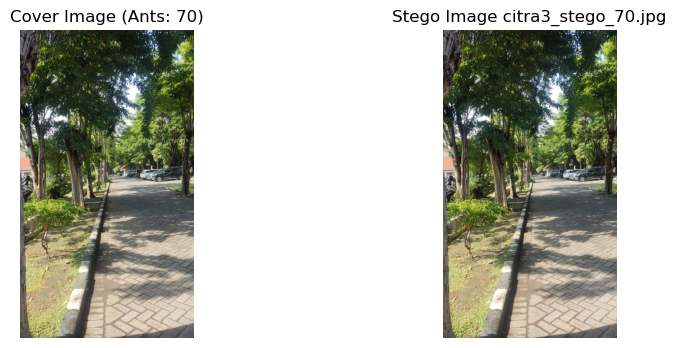

Evaluation Metrics for citra3_stego_70.jpg:
Capacity       : 0.0003
PSNR (dB)      : 85.76
MSE            : 0.0002
NC             : 1.0000
BPP            : 0.0003
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra3.png with 100 ants ===


ACO Optimization: 100%|██████████| 100/100 [02:34<00:00,  1.54s/it]


Complex pixels: 69871
Ant Journeys (start_pos -> end_pos):
Ant 1: (174, 389) -> (170, 385)
Ant 2: (914, 332) -> (920, 333)
Ant 3: (550, 327) -> (539, 328)
Ant 4: (677, 229) -> (667, 215)
Ant 5: (712, 234) -> (705, 238)
Ant 6: (6, 561) -> (14, 569)
Ant 7: (673, 35) -> (662, 29)
Ant 8: (1125, 604) -> (1112, 607)
Ant 9: (1239, 227) -> (1236, 232)
Ant 10: (927, 517) -> (939, 526)
Ant 11: (1101, 132) -> (1084, 118)
Ant 12: (650, 579) -> (656, 582)
Ant 13: (374, 182) -> (379, 176)
Ant 14: (733, 531) -> (738, 534)
Ant 15: (1054, 319) -> (1058, 322)
Ant 16: (115, 560) -> (106, 561)
Ant 17: (285, 140) -> (282, 137)
Ant 18: (1165, 550) -> (1149, 556)
Ant 19: (43, 73) -> (37, 81)
Ant 20: (1, 292) -> (4, 311)
Ant 21: (45, 81) -> (37, 90)
Ant 22: (761, 184) -> (752, 170)
Ant 23: (410, 194) -> (392, 185)
Ant 24: (191, 528) -> (184, 527)
Ant 25: (213, 120) -> (228, 113)
Ant 26: (1189, 418) -> (1197, 427)
Ant 27: (1075, 18) -> (1095, 6)
Ant 28: (555, 489) -> (562, 483)
Ant 29: (411, 268) -> (405, 275)

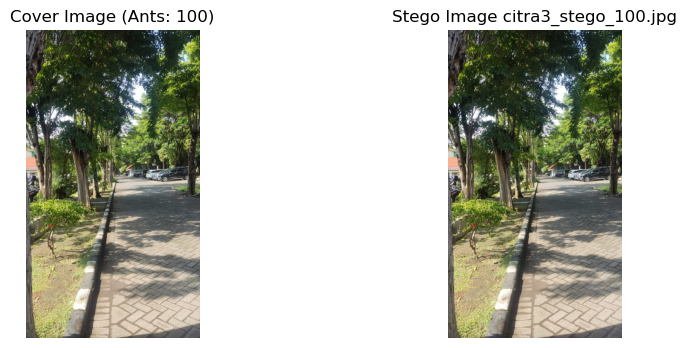

Evaluation Metrics for citra3_stego_100.jpg:
Capacity       : 0.0003
PSNR (dB)      : 85.94
MSE            : 0.0002
NC             : 1.0000
BPP            : 0.0003
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra4.png with 10 ants ===


ACO Optimization: 100%|██████████| 100/100 [00:16<00:00,  6.18it/s]


Complex pixels: 10319
Ant Journeys (start_pos -> end_pos):
Ant 1: (274, 723) -> (259, 725)
Ant 2: (65, 38) -> (63, 37)
Ant 3: (331, 810) -> (323, 805)
Ant 4: (32, 87) -> (31, 97)
Ant 5: (567, 18) -> (567, 11)
Ant 6: (772, 1033) -> (775, 1042)
Ant 7: (835, 1084) -> (827, 1074)
Ant 8: (128, 960) -> (117, 966)
Ant 9: (540, 559) -> (552, 562)
Ant 10: (741, 74) -> (733, 67)
Stego image saved as: citra4_stego_10.jpg


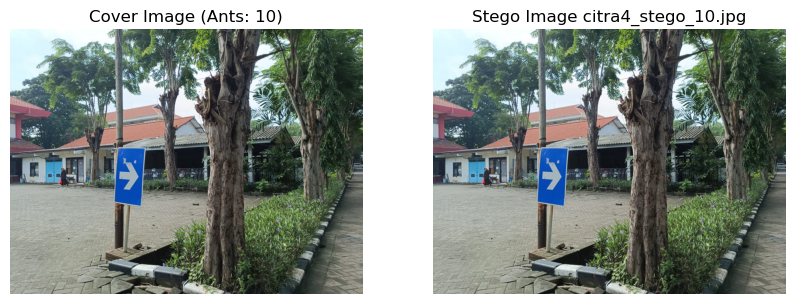

Evaluation Metrics for citra4_stego_10.jpg:
Capacity       : 0.0003
PSNR (dB)      : 86.60
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0003
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra4.png with 30 ants ===


ACO Optimization: 100%|██████████| 100/100 [00:41<00:00,  2.38it/s]


Complex pixels: 27354
Ant Journeys (start_pos -> end_pos):
Ant 1: (223, 384) -> (226, 385)
Ant 2: (213, 713) -> (217, 712)
Ant 3: (628, 727) -> (627, 728)
Ant 4: (223, 30) -> (224, 35)
Ant 5: (317, 241) -> (310, 239)
Ant 6: (658, 664) -> (656, 657)
Ant 7: (431, 270) -> (431, 258)
Ant 8: (758, 1127) -> (753, 1132)
Ant 9: (379, 998) -> (376, 997)
Ant 10: (359, 926) -> (364, 923)
Ant 11: (593, 924) -> (602, 912)
Ant 12: (493, 236) -> (481, 242)
Ant 13: (76, 137) -> (89, 129)
Ant 14: (7, 533) -> (23, 521)
Ant 15: (124, 969) -> (122, 958)
Ant 16: (522, 909) -> (512, 917)
Ant 17: (120, 909) -> (129, 901)
Ant 18: (101, 835) -> (92, 845)
Ant 19: (556, 1129) -> (545, 1130)
Ant 20: (53, 62) -> (55, 79)
Ant 21: (104, 469) -> (95, 471)
Ant 22: (305, 319) -> (309, 315)
Ant 23: (227, 302) -> (241, 305)
Ant 24: (56, 359) -> (51, 339)
Ant 25: (59, 3) -> (54, 9)
Ant 26: (708, 568) -> (715, 562)
Ant 27: (651, 740) -> (661, 741)
Ant 28: (867, 883) -> (866, 873)
Ant 29: (260, 101) -> (262, 102)
Ant 30: (7

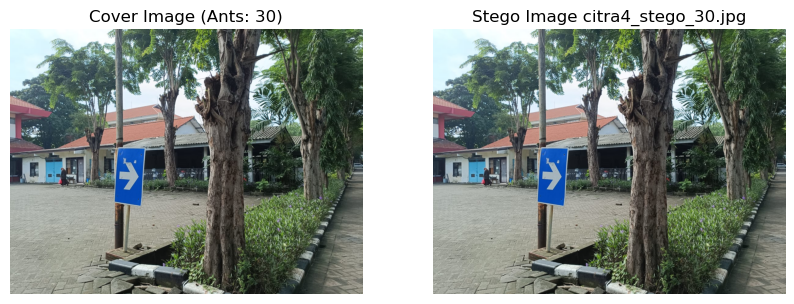

Evaluation Metrics for citra4_stego_30.jpg:
Capacity       : 0.0003
PSNR (dB)      : 86.24
MSE            : 0.0002
NC             : 1.0000
BPP            : 0.0003
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra4.png with 50 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Complex pixels: 41263
Ant Journeys (start_pos -> end_pos):
Ant 1: (758, 505) -> (757, 501)
Ant 2: (145, 751) -> (137, 752)
Ant 3: (158, 1050) -> (149, 1049)
Ant 4: (54, 170) -> (43, 176)
Ant 5: (427, 639) -> (432, 629)
Ant 6: (751, 979) -> (749, 979)
Ant 7: (79, 529) -> (73, 526)
Ant 8: (125, 232) -> (125, 227)
Ant 9: (771, 625) -> (769, 637)
Ant 10: (428, 1093) -> (432, 1101)
Ant 11: (211, 844) -> (214, 835)
Ant 12: (180, 814) -> (199, 824)
Ant 13: (164, 133) -> (166, 136)
Ant 14: (17, 983) -> (14, 1001)
Ant 15: (126, 563) -> (135, 555)
Ant 16: (772, 817) -> (777, 797)
Ant 17: (826, 998) -> (829, 1009)
Ant 18: (25, 649) -> (16, 668)
Ant 19: (444, 278) -> (454, 277)
Ant 20: (388, 474) -> (375, 467)
Ant 21: (471, 796) -> (480, 776)
Ant 22: (743, 99) -> (742, 97)
Ant 23: (792, 795) -> (790, 791)
Ant 24: (243, 623) -> (247, 633)
Ant 25: (815, 1046) -> (822, 1044)
Ant 26: (654, 1057) -> (640, 1063)
Ant 27: (1, 372) -> (2, 376)
Ant 28: (493, 922) -> (506, 924)
Ant 29: (794, 53) -> (799, 49)

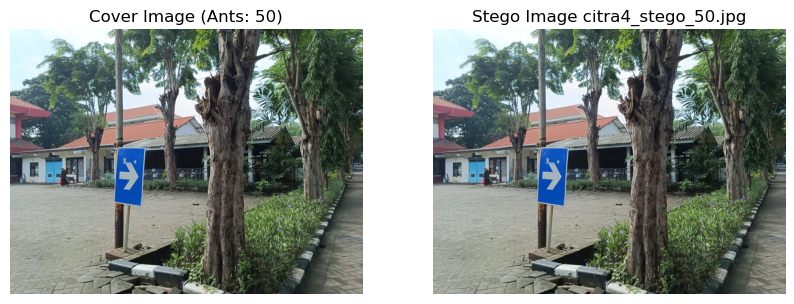

Evaluation Metrics for citra4_stego_50.jpg:
Capacity       : 0.0003
PSNR (dB)      : 86.48
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0003
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra4.png with 70 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:42<00:00,  1.02s/it]


Complex pixels: 53995
Ant Journeys (start_pos -> end_pos):
Ant 1: (768, 451) -> (774, 452)
Ant 2: (772, 69) -> (773, 58)
Ant 3: (644, 421) -> (637, 426)
Ant 4: (279, 665) -> (271, 657)
Ant 5: (690, 459) -> (682, 468)
Ant 6: (296, 687) -> (292, 683)
Ant 7: (445, 759) -> (457, 762)
Ant 8: (232, 913) -> (230, 916)
Ant 9: (768, 926) -> (784, 917)
Ant 10: (555, 916) -> (551, 918)
Ant 11: (414, 81) -> (428, 71)
Ant 12: (312, 347) -> (304, 339)
Ant 13: (467, 445) -> (480, 446)
Ant 14: (0, 839) -> (7, 831)
Ant 15: (606, 351) -> (615, 357)
Ant 16: (441, 18) -> (441, 17)
Ant 17: (118, 761) -> (113, 752)
Ant 18: (157, 788) -> (167, 785)
Ant 19: (70, 94) -> (65, 90)
Ant 20: (573, 258) -> (568, 259)
Ant 21: (202, 100) -> (195, 103)
Ant 22: (60, 20) -> (53, 17)
Ant 23: (739, 237) -> (733, 238)
Ant 24: (778, 444) -> (763, 437)
Ant 25: (165, 12) -> (160, 7)
Ant 26: (736, 923) -> (738, 932)
Ant 27: (829, 538) -> (822, 549)
Ant 28: (320, 755) -> (323, 766)
Ant 29: (167, 190) -> (171, 190)
Ant 30: (113, 

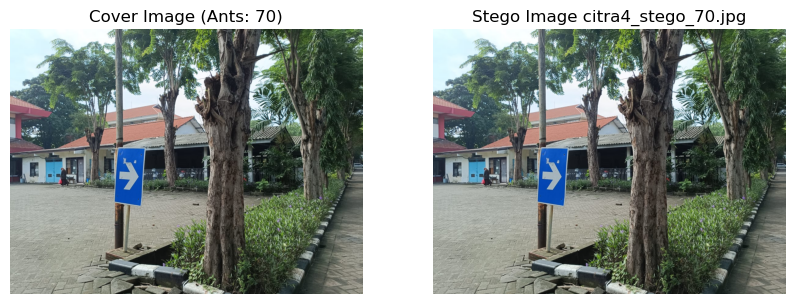

Evaluation Metrics for citra4_stego_70.jpg:
Capacity       : 0.0003
PSNR (dB)      : 86.34
MSE            : 0.0002
NC             : 1.0000
BPP            : 0.0003
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra4.png with 100 ants ===


ACO Optimization: 100%|██████████| 100/100 [02:37<00:00,  1.58s/it]


Complex pixels: 69575
Ant Journeys (start_pos -> end_pos):
Ant 1: (157, 959) -> (158, 947)
Ant 2: (835, 149) -> (839, 135)
Ant 3: (734, 584) -> (743, 569)
Ant 4: (143, 489) -> (137, 492)
Ant 5: (678, 415) -> (670, 411)
Ant 6: (620, 268) -> (647, 258)
Ant 7: (218, 793) -> (199, 791)
Ant 8: (719, 471) -> (707, 458)
Ant 9: (528, 243) -> (536, 236)
Ant 10: (259, 968) -> (261, 965)
Ant 11: (220, 98) -> (218, 94)
Ant 12: (730, 634) -> (729, 626)
Ant 13: (646, 833) -> (653, 829)
Ant 14: (285, 69) -> (292, 81)
Ant 15: (401, 543) -> (413, 542)
Ant 16: (778, 341) -> (783, 339)
Ant 17: (676, 53) -> (676, 43)
Ant 18: (296, 362) -> (294, 361)
Ant 19: (764, 474) -> (774, 485)
Ant 20: (472, 1090) -> (474, 1095)
Ant 21: (179, 1087) -> (176, 1090)
Ant 22: (332, 312) -> (309, 321)
Ant 23: (129, 126) -> (117, 117)
Ant 24: (96, 640) -> (103, 639)
Ant 25: (573, 506) -> (563, 490)
Ant 26: (362, 160) -> (346, 141)
Ant 27: (686, 635) -> (701, 644)
Ant 28: (649, 464) -> (645, 451)
Ant 29: (536, 1066) -> (533, 

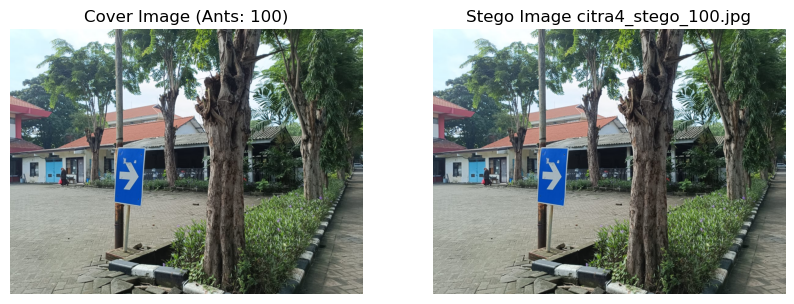

Evaluation Metrics for citra4_stego_100.jpg:
Capacity       : 0.0003
PSNR (dB)      : 86.34
MSE            : 0.0002
NC             : 1.0000
BPP            : 0.0003
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra5.png with 10 ants ===


ACO Optimization: 100%|██████████| 100/100 [00:17<00:00,  5.84it/s]


Complex pixels: 6689
Ant Journeys (start_pos -> end_pos):
Ant 1: (293, 656) -> (295, 652)
Ant 2: (376, 779) -> (384, 775)
Ant 3: (71, 887) -> (63, 886)
Ant 4: (720, 635) -> (716, 648)
Ant 5: (815, 227) -> (810, 231)
Ant 6: (1074, 641) -> (1068, 640)
Ant 7: (614, 862) -> (603, 861)
Ant 8: (1328, 442) -> (1333, 429)
Ant 9: (264, 768) -> (258, 774)
Ant 10: (355, 1122) -> (357, 1116)
Stego image saved as: citra5_stego_10.jpg


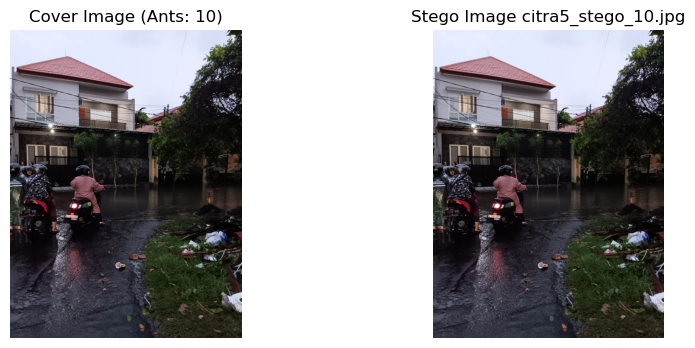

Evaluation Metrics for citra5_stego_10.jpg:
Capacity       : 0.0002
PSNR (dB)      : 89.26
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0002
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra5.png with 30 ants ===


ACO Optimization: 100%|██████████| 100/100 [00:42<00:00,  2.33it/s]


Complex pixels: 19382
Ant Journeys (start_pos -> end_pos):
Ant 1: (872, 904) -> (876, 902)
Ant 2: (1452, 578) -> (1467, 574)
Ant 3: (95, 640) -> (87, 631)
Ant 4: (484, 48) -> (492, 52)
Ant 5: (1111, 759) -> (1100, 770)
Ant 6: (1566, 560) -> (1566, 571)
Ant 7: (754, 33) -> (747, 35)
Ant 8: (1280, 676) -> (1266, 671)
Ant 9: (372, 69) -> (359, 66)
Ant 10: (440, 969) -> (444, 982)
Ant 11: (1009, 870) -> (999, 871)
Ant 12: (1567, 669) -> (1574, 667)
Ant 13: (1563, 971) -> (1557, 973)
Ant 14: (243, 312) -> (247, 318)
Ant 15: (44, 272) -> (47, 274)
Ant 16: (768, 609) -> (764, 613)
Ant 17: (1039, 833) -> (1034, 829)
Ant 18: (1132, 399) -> (1137, 406)
Ant 19: (782, 602) -> (767, 611)
Ant 20: (143, 994) -> (156, 1000)
Ant 21: (255, 658) -> (256, 659)
Ant 22: (1103, 506) -> (1094, 510)
Ant 23: (149, 122) -> (151, 113)
Ant 24: (1586, 577) -> (1580, 579)
Ant 25: (1243, 225) -> (1248, 230)
Ant 26: (413, 1111) -> (389, 1107)
Ant 27: (559, 17) -> (561, 14)
Ant 28: (248, 617) -> (230, 632)
Ant 29: (940

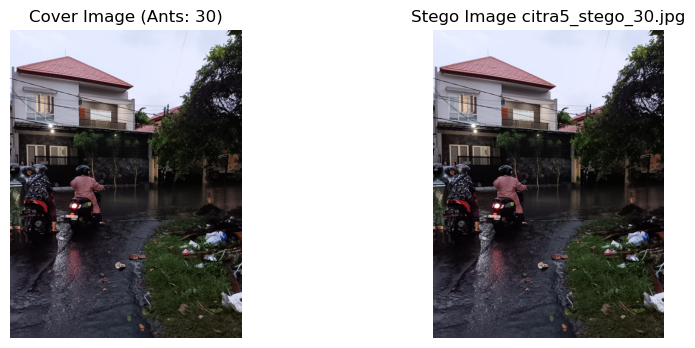

Evaluation Metrics for citra5_stego_30.jpg:
Capacity       : 0.0002
PSNR (dB)      : 89.75
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0002
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra5.png with 50 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:13<00:00,  1.35it/s]


Complex pixels: 31519
Ant Journeys (start_pos -> end_pos):
Ant 1: (841, 221) -> (830, 218)
Ant 2: (42, 200) -> (41, 204)
Ant 3: (1560, 132) -> (1566, 142)
Ant 4: (587, 1037) -> (574, 1041)
Ant 5: (1279, 174) -> (1278, 186)
Ant 6: (164, 372) -> (173, 369)
Ant 7: (44, 878) -> (40, 879)
Ant 8: (1555, 833) -> (1543, 821)
Ant 9: (325, 1186) -> (314, 1188)
Ant 10: (577, 806) -> (577, 810)
Ant 11: (597, 349) -> (598, 346)
Ant 12: (131, 557) -> (132, 563)
Ant 13: (589, 856) -> (595, 864)
Ant 14: (1389, 188) -> (1383, 179)
Ant 15: (40, 44) -> (38, 37)
Ant 16: (595, 442) -> (600, 450)
Ant 17: (123, 845) -> (120, 828)
Ant 18: (1438, 813) -> (1447, 823)
Ant 19: (470, 361) -> (468, 360)
Ant 20: (640, 552) -> (633, 551)
Ant 21: (1169, 934) -> (1164, 925)
Ant 22: (1335, 17) -> (1324, 26)
Ant 23: (1262, 439) -> (1257, 444)
Ant 24: (774, 997) -> (774, 1003)
Ant 25: (1545, 372) -> (1552, 373)
Ant 26: (1594, 943) -> (1596, 947)
Ant 27: (879, 620) -> (883, 627)
Ant 28: (1258, 177) -> (1244, 186)
Ant 29: (

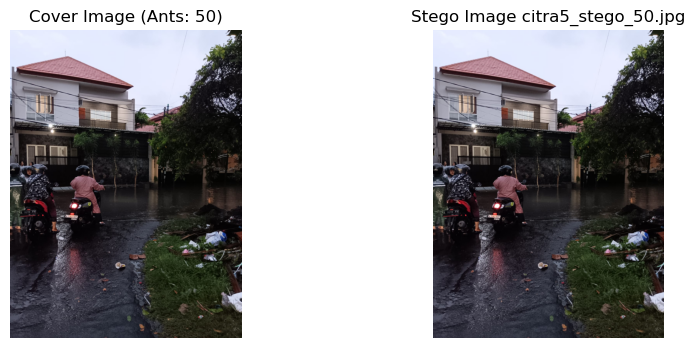

Evaluation Metrics for citra5_stego_50.jpg:
Capacity       : 0.0002
PSNR (dB)      : 89.30
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0002
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra5.png with 70 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:51<00:00,  1.11s/it]


Complex pixels: 43008
Ant Journeys (start_pos -> end_pos):
Ant 1: (1125, 845) -> (1138, 846)
Ant 2: (306, 576) -> (312, 577)
Ant 3: (7, 901) -> (10, 895)
Ant 4: (333, 531) -> (323, 532)
Ant 5: (172, 554) -> (175, 560)
Ant 6: (1455, 97) -> (1458, 92)
Ant 7: (251, 296) -> (260, 304)
Ant 8: (313, 458) -> (334, 457)
Ant 9: (1247, 747) -> (1256, 739)
Ant 10: (519, 405) -> (512, 402)
Ant 11: (1458, 28) -> (1467, 28)
Ant 12: (27, 921) -> (13, 914)
Ant 13: (561, 1050) -> (561, 1048)
Ant 14: (940, 1039) -> (957, 1027)
Ant 15: (292, 464) -> (289, 456)
Ant 16: (1090, 241) -> (1093, 237)
Ant 17: (1595, 1027) -> (1596, 1031)
Ant 18: (1527, 986) -> (1526, 974)
Ant 19: (984, 1008) -> (984, 1004)
Ant 20: (999, 94) -> (1007, 100)
Ant 21: (614, 528) -> (614, 528)
Ant 22: (1555, 1071) -> (1558, 1088)
Ant 23: (942, 619) -> (943, 613)
Ant 24: (1157, 164) -> (1152, 172)
Ant 25: (166, 263) -> (164, 275)
Ant 26: (881, 664) -> (882, 659)
Ant 27: (1001, 818) -> (1006, 821)
Ant 28: (50, 488) -> (33, 488)
Ant 29:

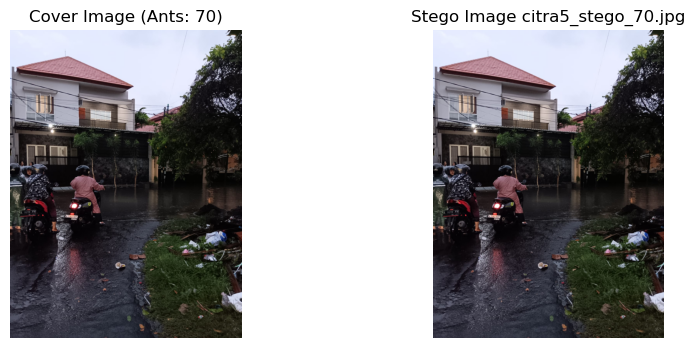

Evaluation Metrics for citra5_stego_70.jpg:
Capacity       : 0.0002
PSNR (dB)      : 89.16
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0002
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing citra5.png with 100 ants ===


ACO Optimization: 100%|██████████| 100/100 [02:45<00:00,  1.65s/it]


Complex pixels: 59175
Ant Journeys (start_pos -> end_pos):
Ant 1: (1542, 888) -> (1544, 889)
Ant 2: (780, 1167) -> (777, 1161)
Ant 3: (1375, 63) -> (1375, 62)
Ant 4: (536, 605) -> (540, 598)
Ant 5: (842, 479) -> (842, 473)
Ant 6: (266, 220) -> (265, 223)
Ant 7: (721, 1032) -> (714, 1031)
Ant 8: (114, 1038) -> (107, 1024)
Ant 9: (329, 804) -> (334, 805)
Ant 10: (1039, 160) -> (1039, 136)
Ant 11: (599, 454) -> (607, 464)
Ant 12: (1060, 42) -> (1057, 46)
Ant 13: (1024, 1118) -> (1024, 1126)
Ant 14: (135, 21) -> (136, 21)
Ant 15: (515, 1030) -> (521, 1036)
Ant 16: (147, 353) -> (149, 344)
Ant 17: (1158, 441) -> (1163, 460)
Ant 18: (1193, 836) -> (1182, 839)
Ant 19: (60, 825) -> (58, 816)
Ant 20: (207, 431) -> (203, 440)
Ant 21: (1065, 944) -> (1066, 941)
Ant 22: (581, 1187) -> (575, 1197)
Ant 23: (58, 36) -> (60, 31)
Ant 24: (760, 22) -> (761, 35)
Ant 25: (1367, 319) -> (1353, 312)
Ant 26: (439, 279) -> (450, 270)
Ant 27: (1146, 1020) -> (1162, 1024)
Ant 28: (729, 40) -> (735, 47)
Ant 29: 

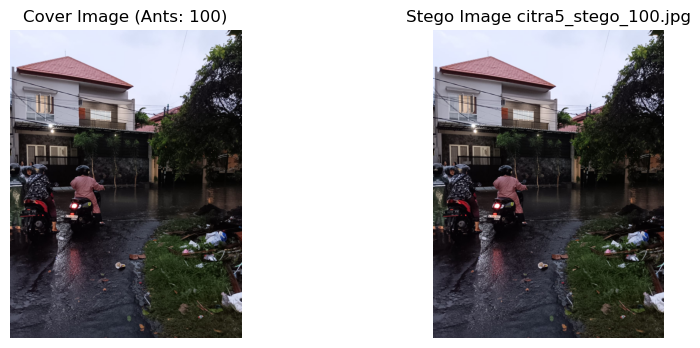

Evaluation Metrics for citra5_stego_100.jpg:
Capacity       : 0.0002
PSNR (dB)      : 89.28
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0002
LPIPS          : 0.0000
Failed to decode extracted message


In [32]:
try:
    loss_fn = lpips.LPIPS(net='alex')
except Exception as e:
    print(f"Failed to initialize LPIPS model: {e}")
    exit(1)

ant_counts = [10, 30, 50, 70, 100]

def process_image(image_path, message, ant_counts, loss_fn):
    base_name = os.path.splitext(os.path.basename(image_path))[0].replace(" ", "_")
    results = []

    if not os.path.exists(image_path):
        print(f"Error: Image file {image_path} not found.")
        print("Please upload the image to  in Colab.")
        if os.path.basename(image_path):
            print(f"Error: Please upload a file named '{os.path.basename(image_path)}'.")
            exit(1)

    cover_image = cv2.imread(image_path)
    if cover_image is None:
        print(f"Error: Failed to load image {image_path}. Check if the file is a valid image.")
        exit(1)
    cover_image = cv2.cvtColor(cover_image, cv2.COLOR_BGR2RGB)

    for ants in ant_counts:
        print(f"\n=== Testing {image_path} with {ants} ants ===")

        aco = ACOSteganography(ants=ants)
        try:
            complex_region, _ = aco.detect_complex_regions(cover_image)
            print(f"Complex pixels: {np.sum(complex_region)}")
            print("Ant Journeys (start_pos -> end_pos):")
            for i, (start, end) in enumerate(aco.ant_journeys):
                print(f"Ant {i+1}: {start} -> {end}")
        except Exception as e:
            print(f"Error in detecting complex regions: {e}")
            continue

        seed_key = f"secret_key_{ants}"
        try:
            stego_image, capacity = aco.embed_message(cover_image, message, complex_region, seed_key=seed_key)
        except Exception as e:
            print(f"Error in embedding message: {e}")
            continue

        stego_image = stego_image.astype(np.uint8)

        stego_image_path = f"{base_name}_stego_{ants}.jpg"
        cv2.imwrite(stego_image_path, cv2.cvtColor(stego_image, cv2.COLOR_RGB2BGR))
        print(f"Stego image saved as: {stego_image_path}")

        mse = np.mean((cover_image.astype("float32") - stego_image.astype("float32")) ** 2)
        psnr = 10 * np.log10(255**2 / mse) if mse != 0 else float('inf')
        nc = np.sum(cover_image * stego_image) / np.sqrt(np.sum(cover_image**2) * np.sum(stego_image**2))
        h, w, c = cover_image.shape
        total_pixels = h * w * c
        message_bits = len(message) * 8
        bpp = message_bits / total_pixels if total_pixels > 0 else 0.0

        try:
            img0 = torch.tensor(cover_image / 255., dtype=torch.float32).permute(2, 0, 1).unsqueeze(0)
            img1 = torch.tensor(stego_image / 255., dtype=torch.float32).permute(2, 0, 1).unsqueeze(0)
            lpips_score = loss_fn(img0, img1).item()
        except Exception as e:
            print(f"Error calculating LPIPS: {e}")
            lpips_score = float('nan')

        plt.figure(figsize=(10, 4))
        plt.subplot(1, 2, 1)
        plt.title(f"Cover Image (Ants: {ants})")
        plt.imshow(cover_image)
        plt.axis("off")
        plt.subplot(1, 2, 2)
        plt.title(f"Stego Image {os.path.basename(stego_image_path)}")
        plt.imshow(stego_image)
        plt.axis("off")
        plt.show()

        print(f"Evaluation Metrics for {os.path.basename(stego_image_path)}:")
        print(f"Capacity       : {capacity:.4f}")
        print(f"PSNR (dB)      : {psnr:.2f}")
        print(f"MSE            : {mse:.4f}")
        print(f"NC             : {nc:.4f}")
        print(f"BPP            : {bpp:.4f}")
        print(f"LPIPS          : {lpips_score:.4f}")

        try:
            extracted = aco.extract_message(stego_image, complex_region, seed_key=seed_key)
            try:
                print(f"Extracted message: {extracted.decode()}")
            except:
                print("Failed to decode extracted message")
        except Exception as e:
            print(f"Error in extracting message: {e}")

        results.append({
            'ants': ants,
            'image_name': os.path.basename(stego_image_path),
            'psnr': psnr,
            'mse': mse,
            'nc': nc,
            'bpp': bpp,
            'lpips': lpips_score,
            'capacity': capacity
        })

    return base_name, results

image_paths = ['citra1.png','citra2.png', 'citra3.png','citra4.png','citra5.png']
all_results = {}

for image_path in image_paths:
    base_name, results = process_image(image_path, message, ant_counts, loss_fn)
    all_results[base_name] = results

In [31]:
for base_name, results in all_results.items():
    print(f"\n=== PSNR Summary for {base_name} ===")
    for result in results:
        print(f"Image {result['image_name']}: PSNR = {result['psnr']:.2f} dB")


=== PSNR Summary for citra1 ===
Image citra1_stego_10.jpg: PSNR = 84.06 dB
Image citra1_stego_30.jpg: PSNR = 84.07 dB
Image citra1_stego_50.jpg: PSNR = 84.04 dB
Image citra1_stego_70.jpg: PSNR = 84.37 dB
Image citra1_stego_100.jpg: PSNR = 84.30 dB

=== PSNR Summary for citra2 ===
Image citra2_stego_10.jpg: PSNR = 97.56 dB
Image citra2_stego_30.jpg: PSNR = 97.59 dB
Image citra2_stego_50.jpg: PSNR = 97.44 dB
Image citra2_stego_70.jpg: PSNR = 97.28 dB
Image citra2_stego_100.jpg: PSNR = 97.54 dB

=== PSNR Summary for citra3 ===
Image citra3_stego_10.jpg: PSNR = 85.91 dB
Image citra3_stego_30.jpg: PSNR = 86.07 dB
Image citra3_stego_50.jpg: PSNR = 85.87 dB
Image citra3_stego_70.jpg: PSNR = 85.76 dB
Image citra3_stego_100.jpg: PSNR = 85.94 dB

=== PSNR Summary for citra4 ===
Image citra4_stego_10.jpg: PSNR = 86.60 dB
Image citra4_stego_30.jpg: PSNR = 86.24 dB
Image citra4_stego_50.jpg: PSNR = 86.48 dB
Image citra4_stego_70.jpg: PSNR = 86.34 dB
Image citra4_stego_100.jpg: PSNR = 86.34 dB

===

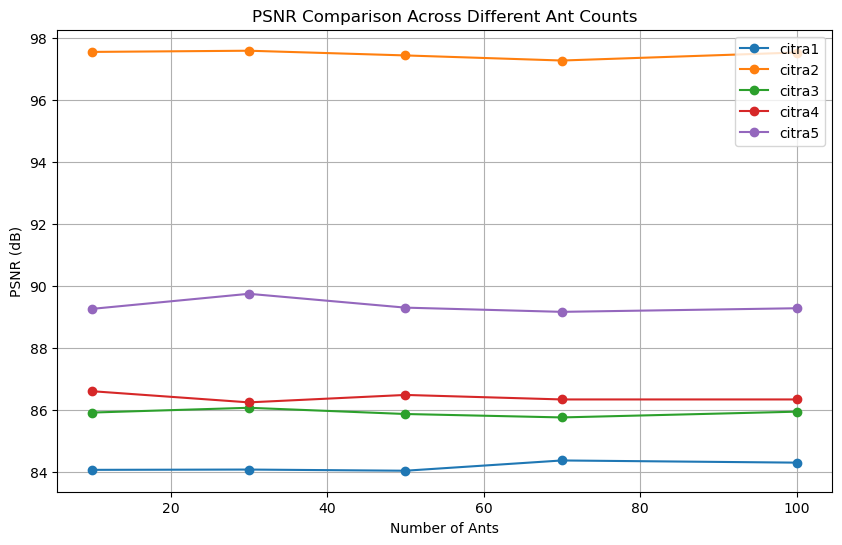

In [30]:
plt.figure(figsize=(10, 6))
for base_name, results in all_results.items():
    ant_values = [result['ants'] for result in results]
    psnr_values = [result['psnr'] for result in results]
    plt.plot(ant_values, psnr_values, marker='o', label=f"{base_name}")

plt.title('PSNR Comparison Across Different Ant Counts')
plt.xlabel('Number of Ants')
plt.ylabel('PSNR (dB)')
plt.grid(True)
plt.legend()
plt.savefig('psnr_comparison.png')
plt.show()

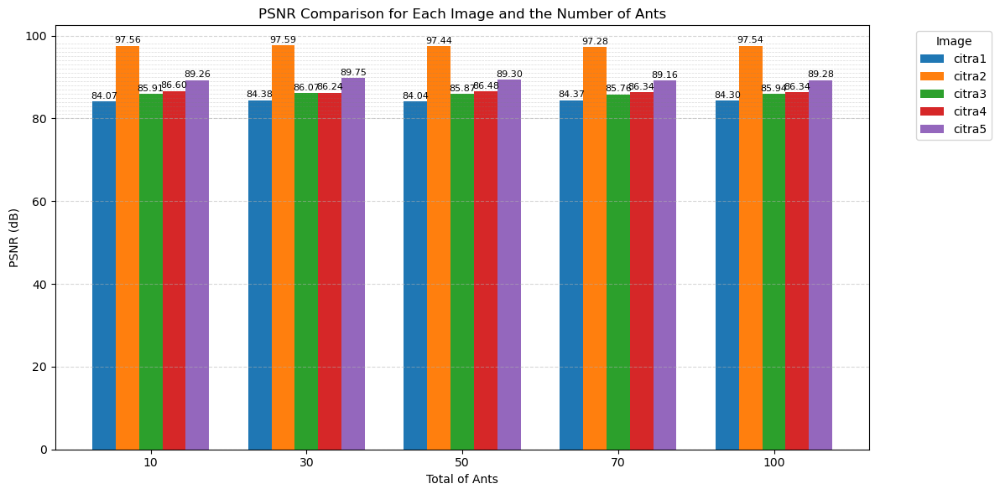

In [34]:
ant_values = ant_counts
image_names = list(all_results.keys())
n_images = len(image_names)
bar_width = 0.15
x = np.arange(len(ant_values))

plt.figure(figsize=(12, 6))

for i, image_name in enumerate(image_names):
    psnr_values = [result['psnr'] for result in all_results[image_name]]
    offset = (i - n_images / 2) * bar_width + bar_width / 2
    bars = plt.bar(x + offset, psnr_values, width=bar_width, label=image_name)

    for j, bar in enumerate(bars):
        height = bar.get_height()
        if height > 80:
            plt.text(bar.get_x() + bar.get_width() / 2, height + 0.3,
                     f"{height:.2f}", ha='center', va='bottom', fontsize=8)

max_psnr = max(result['psnr'] for results in all_results.values() for result in results)
for y in np.arange(80, max_psnr + 1, 1):
    plt.axhline(y, color='gray', linestyle='--', linewidth=0.5, alpha=0.3)

plt.xlabel('Total of Ants')
plt.ylabel('PSNR (dB)')
plt.title('PSNR Comparison for Each Image and the Number of Ants')
plt.xticks(x, ant_values)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(title="Image", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()